# Movie Genre Classification [TF-IDF](https://scikit-learn.org/1.5/modules/generated/sklearn.feature_extraction.text.TfidfVectorizer.html) and [Naive Bayes](https://scikit-learn.org/1.5/modules/naive_bayes.html)

### Temu Kembali Informasi 7C

This notebook is an example of how to use the TF-IDF and Naive Bayes algorithms to classify movie genres. And also this notebook for mid-term project of the course "Temu Kembali Informasi" in Univesity of Muhammadiyah Malang.

The dataset if from kaggle: https://www.kaggle.com/datasets/hijest/genre-classification-dataset-imdb

Download the dataset, name it "Genre Classification Dataset", and extract it to the folder where this notebook is located.

The dataset contains 3 files:
- `train_data.csv`: contains the movie title, plot, and genre.
- `test_data.csv`: contains the movie title, plot, and genre.
- `test_data_solution.csv`: contains the movie title, plot, and genre.
- `description.csv`: contains the train and test data description.

Then download the requirements.txt file and run the following command to install the required libraries:
```bash
pip install -r requirements.txt
```

In [34]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords
from wordcloud import WordCloud

In [35]:
import nltk
import os

# Set the custom download path for NLTK data
custom_download_path = '/kaggle/working/nltk_data'

# Make sure the directory exists; if not, create it
os.makedirs(custom_download_path, exist_ok=True)

# Append the custom download path to NLTK data path
nltk.data.path.append(custom_download_path)

nltk.download('punkt', download_dir=custom_download_path)
nltk.download('punkt_tab', download_dir=custom_download_path)
nltk.download('stopwords', download_dir=custom_download_path)
nltk.download('wordnet', download_dir=custom_download_path)

[nltk_data] Downloading package punkt to /kaggle/working/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package punkt_tab to
[nltk_data]     /kaggle/working/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /kaggle/working/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     /kaggle/working/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [36]:
import warnings

# Ignore all warnings
warnings.filterwarnings("ignore")

In [37]:
# Read the txt files using pandas
train_data = pd.read_csv("Genre Classification Dataset/train_data.txt", delimiter=':::' ,header = None ,engine='python')
test_data  = pd.read_csv("Genre Classification Dataset/test_data.txt", delimiter=':::' ,header = None ,engine='python')
test_data_solution  = pd.read_csv("Genre Classification Dataset/test_data_solution.txt", delimiter=':::' ,header = None ,engine='python')

In [38]:
## View train data
print("shape",train_data.shape)
train_data.head()

shape (54214, 4)


,0,1,2,3
0,1,Oscar et la dame rose (2009),drama,Listening in to a conversation between his do...
1,2,Cupid (1997),thriller,A brother and sister with a past incestuous r...
2,3,"Young, Wild and Wonderful (1980)",adult,As the bus empties the students for their fie...
3,4,The Secret Sin (1915),drama,To help their unemployed father make ends mee...
4,5,The Unrecovered (2007),drama,The film's title refers not only to the un-re...


In [39]:
## View the test solution data
print("shape",test_data_solution.shape)
test_data_solution.head()

shape (54200, 4)


,0,1,2,3
0,1,Edgar's Lunch (1998),thriller,"L.R. Brane loves his life - his car, his apar..."
1,2,La guerra de papá (1977),comedy,"Spain, March 1964: Quico is a very naughty ch..."
2,3,Off the Beaten Track (2010),documentary,One year in the life of Albin and his family ...
3,4,Meu Amigo Hindu (2015),drama,"His father has died, he hasn't spoken with hi..."
4,5,Er nu zhai (1955),drama,Before he was known internationally as a mart...


In [40]:
## We will concat the test and train file

df = pd.concat((train_data ,test_data_solution))
df.columns = ["id" ,"Title","Genre","Description"]
df.head()

,id,Title,Genre,Description
0,1,Oscar et la dame rose (2009),drama,Listening in to a conversation between his do...
1,2,Cupid (1997),thriller,A brother and sister with a past incestuous r...
2,3,"Young, Wild and Wonderful (1980)",adult,As the bus empties the students for their fie...
3,4,The Secret Sin (1915),drama,To help their unemployed father make ends mee...
4,5,The Unrecovered (2007),drama,The film's title refers not only to the un-re...


In [41]:
## Check the size
df.shape

(108414, 4)

In [42]:
## Check for Duplicates and Remove them
df.duplicated().sum() ## Will give us a number of duplicates
df.drop_duplicates(inplace = True)  ## Will drops any duplicates

In [43]:
## Check for nan values
df.isna().sum()  # Will check for any duplicates
df.dropna( inplace = True ) ## Will drop any nan containing row if exists

In [44]:
## Check the size
df.shape

(108414, 4)

In [45]:
## function to preprocess the data
stopword = set(stopwords.words('english'))

def preprocessing(text):
    # Convert text to lowercase
    text = text.lower()

    # Remove punctuation using regular expressions
    text = re.sub(r'[^\w\s]', '', text)

    # Remove specific characters #, @, and $
    text = re.sub(r'[#@\$]', '', text)

    # tokenize and convert to list
    tokens = word_tokenize(text)

    ## Lemmatize it
    lemmatizer  = WordNetLemmatizer()

    ## lemmatize each token
    # text = [lemmatizer.lemmatize(token) for token in tokens]
    text = text.split()

    text = [word for word in text if word not in stopword]


    return " ".join(text)

In [46]:
## Create list of words in discription column
df["Despcription_clean"] = df["Description"].apply(preprocessing)

In [47]:
df.head()

,id,Title,Genre,Description,Despcription_clean
0,1,Oscar et la dame rose (2009),drama,Listening in to a conversation between his do...,listening conversation doctor parents 10yearol...
1,2,Cupid (1997),thriller,A brother and sister with a past incestuous r...,brother sister past incestuous relationship cu...
2,3,"Young, Wild and Wonderful (1980)",adult,As the bus empties the students for their fie...,bus empties students field trip museum natural...
3,4,The Secret Sin (1915),drama,To help their unemployed father make ends mee...,help unemployed father make ends meet edith tw...
4,5,The Unrecovered (2007),drama,The film's title refers not only to the un-re...,films title refers unrecovered bodies ground z...


In [48]:
## Shows us the label counts
df["Genre"].value_counts()

Genre
drama           27225
documentary     26192
comedy          14893
short           10145
horror           4408
thriller         3181
action           2629
western          2064
reality-tv       1767
family           1567
adventure        1550
music            1462
romance          1344
sci-fi           1293
adult            1180
crime            1010
animation         996
sport             863
talk-show         782
fantasy           645
mystery           637
musical           553
biography         529
history           486
game-show         387
news              362
war               264
Name: count, dtype: int64

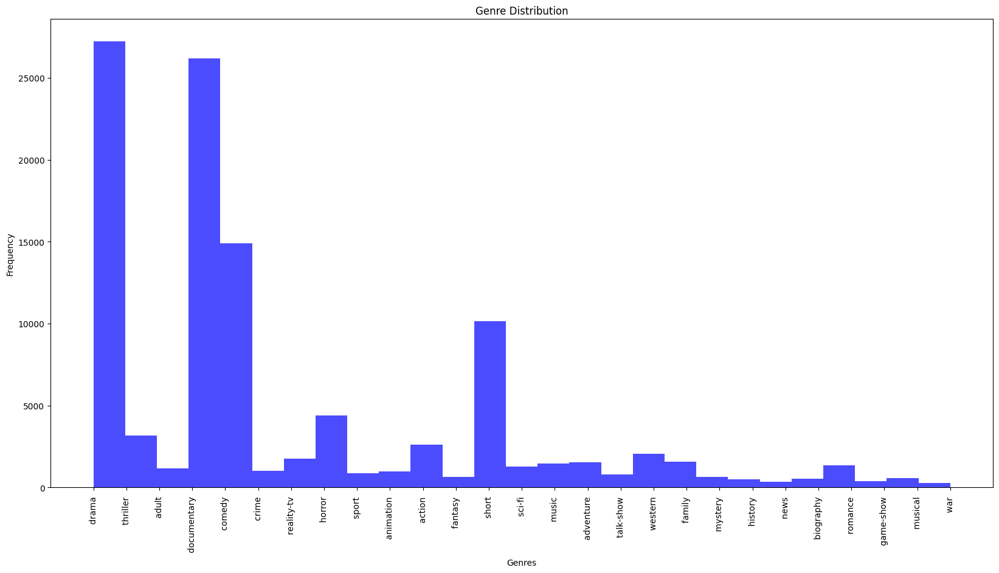

In [49]:
# Create a histogram of genre distribution
plt.figure(figsize=(20, 10))
plt.hist(df["Genre"],bins =27 , color='blue', alpha=0.7)
plt.title("Genre Distribution")
plt.xlabel("Genres")
plt.ylabel("Frequency")
plt.xticks(rotation=90)
plt.show()

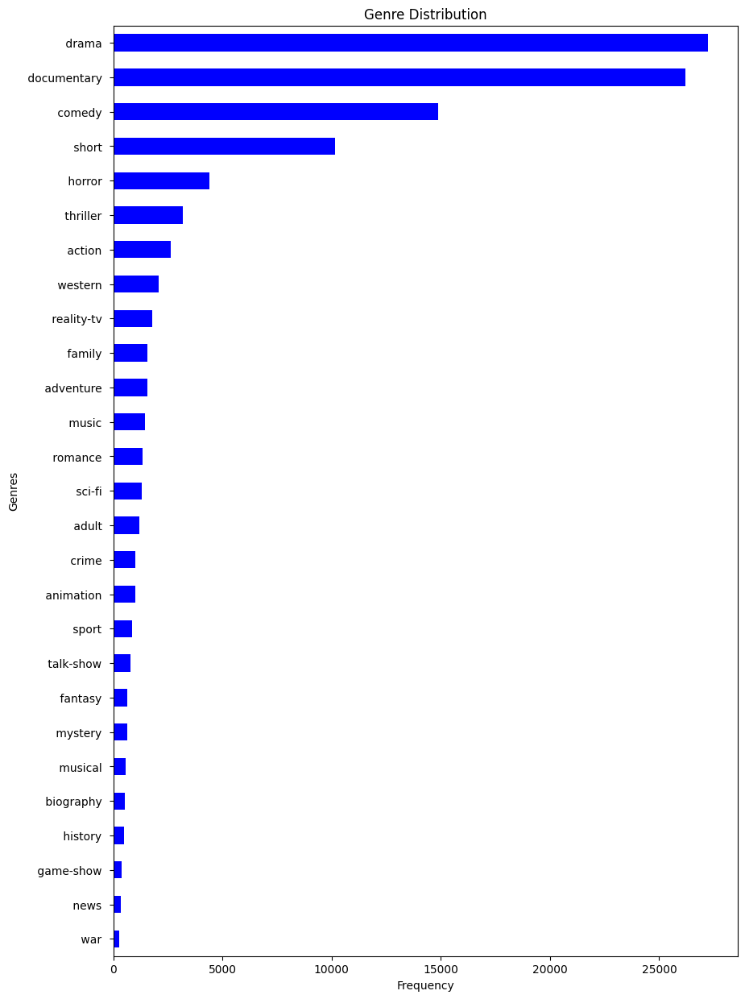

In [50]:
## View genre distribution on Horizontal graph
genre_counts = df["Genre"].value_counts()
sorted_genres = genre_counts.sort_values(ascending=True)

# Create a horizontal histogram of genre distribution
plt.figure(figsize=(10, 15))
sorted_genres.plot(kind='barh',color = "blue", alpha=1 )
plt.title("Genre Distribution")
plt.xlabel("Frequency")
plt.ylabel("Genres")
plt.show()

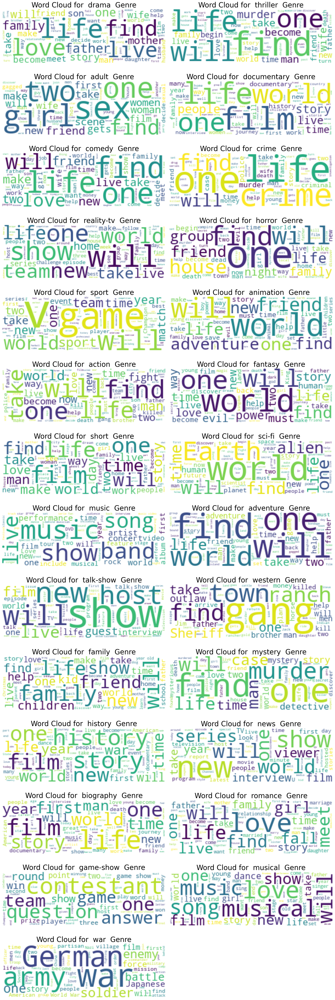

In [51]:
# Create a list of unique genres from the dataset
genres = df['Genre'].unique()

# Set the figure size outside the loop
plt.figure(figsize=(20, 60))

# Iterate over each genre
for i, genre in enumerate(genres, 1):
    plt.subplot(14, 2, i)  # Assuming you have 14 rows and 2 columns for 28 genres
    text_subset = " ".join(list(df[df["Genre"] == genre]['Description']))
    wordcloud = WordCloud(max_words=300, width=300, height=100, background_color='white').generate(text_subset)
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Word Cloud for {genre} Genre',fontsize=30)
    plt.axis('off')


plt.tight_layout()
plt.show()

In [55]:
## remove id column from head
data = df.drop(["Title","id"] , axis = 1) # will drop column
data.head()

,Genre,Description,Despcription_clean
0,drama,Listening in to a conversation between his do...,listening conversation doctor parents 10yearol...
1,thriller,A brother and sister with a past incestuous r...,brother sister past incestuous relationship cu...
2,adult,As the bus empties the students for their fie...,bus empties students field trip museum natural...
3,drama,To help their unemployed father make ends mee...,help unemployed father make ends meet edith tw...
4,drama,The film's title refers not only to the un-re...,films title refers unrecovered bodies ground z...


In [56]:
## import necessary library for
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.naive_bayes import MultinomialNB
from sklearn.ensemble import RandomForestClassifier

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report,confusion_matrix,ConfusionMatrixDisplay

In [57]:
#Convert sentiment labels to numerical values for modeling
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
data['Genre_encoded'] = label_encoder.fit_transform(data['Genre'])
data['Genre_encoded']

class_names= list(label_encoder.classes_)
class_names

[' action ',
 ' adult ',
 ' adventure ',
 ' animation ',
 ' biography ',
 ' comedy ',
 ' crime ',
 ' documentary ',
 ' drama ',
 ' family ',
 ' fantasy ',
 ' game-show ',
 ' history ',
 ' horror ',
 ' music ',
 ' musical ',
 ' mystery ',
 ' news ',
 ' reality-tv ',
 ' romance ',
 ' sci-fi ',
 ' short ',
 ' sport ',
 ' talk-show ',
 ' thriller ',
 ' war ',
 ' western ']

In [58]:
data.head()

,Genre,Description,Despcription_clean,Genre_encoded
0,drama,Listening in to a conversation between his do...,listening conversation doctor parents 10yearol...,8
1,thriller,A brother and sister with a past incestuous r...,brother sister past incestuous relationship cu...,24
2,adult,As the bus empties the students for their fie...,bus empties students field trip museum natural...,1
3,drama,To help their unemployed father make ends mee...,help unemployed father make ends meet edith tw...,8
4,drama,The film's title refers not only to the un-re...,films title refers unrecovered bodies ground z...,8


In [60]:
## Split the data
x = data["Despcription_clean"]
y = data["Genre"]

x_train ,x_test ,y_train ,y_test = train_test_split(x ,y ,test_size = 0.5)

In [61]:
vectorize = CountVectorizer()
x_train1 = vectorize.fit_transform(x_train)
x_test1 =  vectorize.transform(x_test)

Model Score on Training data 0.6386813511170144
Model Score on Training data 0.5261313114542402
               precision    recall  f1-score   support

      action        0.03      0.66      0.06        62
       adult        0.03      0.76      0.05        21
   adventure        0.05      0.55      0.10        75
   animation        0.00      0.00      0.00         0
   biography        0.00      0.00      0.00         1
      comedy        0.44      0.54      0.49      6161
       crime        0.00      0.00      0.00         0
 documentary        0.90      0.57      0.70     20772
       drama        0.83      0.46      0.59     24557
      family        0.00      0.20      0.00        10
     fantasy        0.00      0.00      0.00        11
   game-show        0.17      1.00      0.30        32
     history        0.00      0.00      0.00         0
      horror        0.28      0.76      0.41       796
       music        0.04      0.88      0.08        34
     musical        0.0

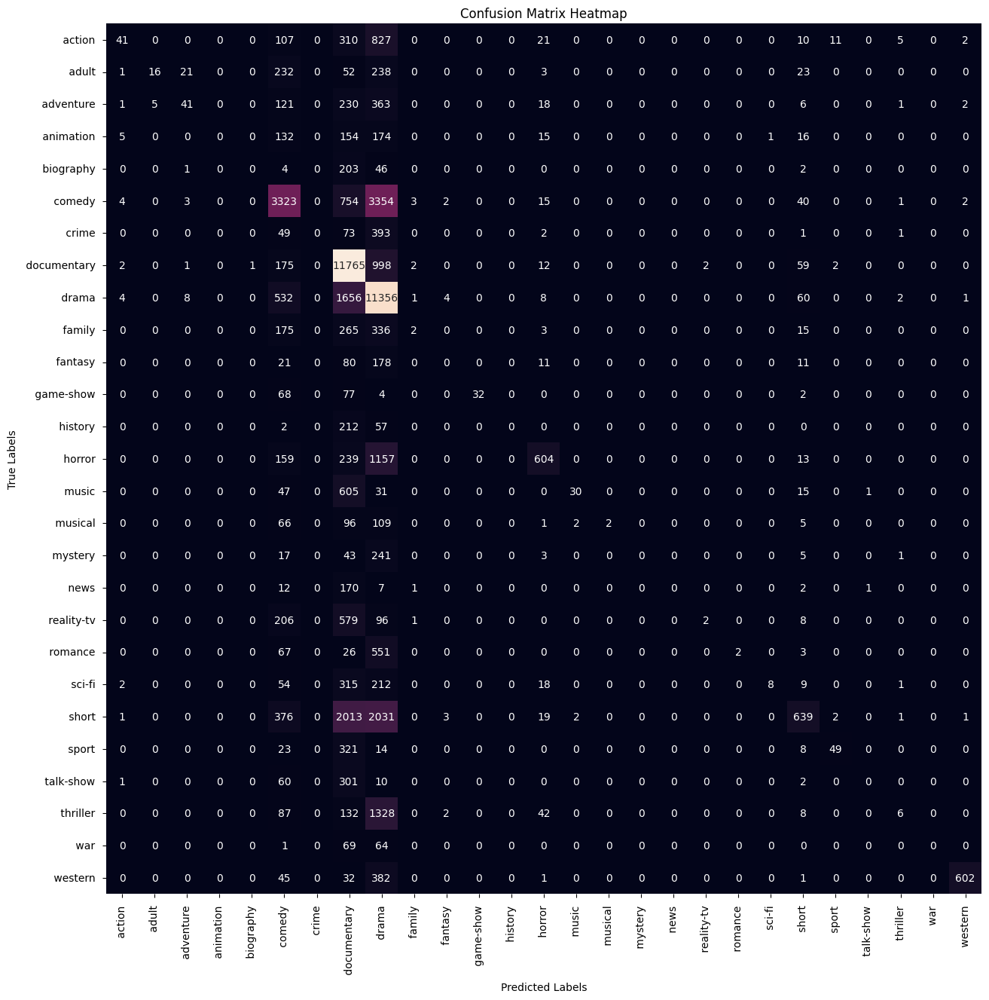

In [62]:
mnb = MultinomialNB()
mnb.fit(x_train1 ,y_train)
print("Model Score on Training data",mnb.score(x_train1 ,y_train))
print("Model Score on Training data",mnb.score(x_test1 ,y_test))
y_pred = mnb.predict(x_test1)

print(classification_report(y_pred ,y_test))

cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(15, 15))  # Adjust the figure size as needed
sns.heatmap(cm, annot=True, fmt='d', cbar=False,
            xticklabels=class_names, yticklabels=class_names)  # Replace 'class_names' with your class labels
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap')
plt.show()

Model Score on Training data 0.9966609478480639
Model Score on Training data 0.5695389894294095
               precision    recall  f1-score   support

      action        0.30      0.40      0.35      1017
       adult        0.41      0.62      0.49       387
   adventure        0.26      0.44      0.32       460
   animation        0.17      0.40      0.24       209
   biography        0.00      0.03      0.01        33
      comedy        0.58      0.53      0.56      8248
       crime        0.09      0.22      0.13       221
 documentary        0.79      0.70      0.74     14578
       drama        0.69      0.57      0.62     16579
      family        0.17      0.33      0.22       402
     fantasy        0.08      0.21      0.11       112
   game-show        0.61      0.83      0.70       134
     history        0.03      0.19      0.06        47
      horror        0.58      0.62      0.60      2024
       music        0.50      0.61      0.55       600
     musical        0.0

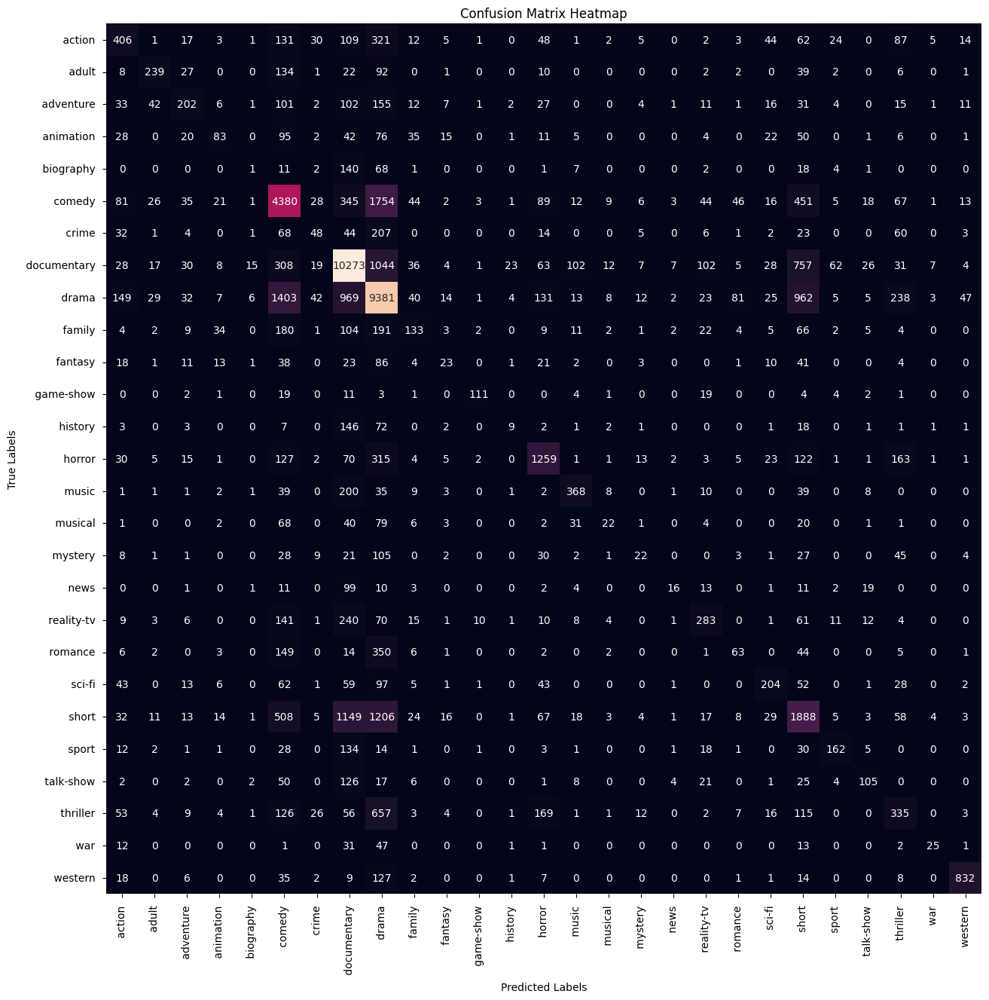

In [63]:
## select Logistic regression for this
model = LogisticRegression()
model.fit(x_train1 ,y_train)
print("Model Score on Training data",model.score(x_train1 ,y_train))
print("Model Score on Training data",model.score(x_test1 ,y_test))
y_pred = model.predict(x_test1)
print(classification_report(y_pred ,y_test))


cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(15, 15))  # Adjust the figure size as needed
sns.heatmap(cm, annot=True, fmt='d', cbar=False,
            xticklabels=class_names, yticklabels=class_names)  # Replace 'class_names' with your class labels
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap')
plt.show()

Model Score on Training data 0.99953880495139
Model Score on Training data 0.5147490176545465
               precision    recall  f1-score   support

      action        0.28      0.33      0.30      1154
       adult        0.41      0.49      0.45       493
   adventure        0.23      0.31      0.27       594
   animation        0.17      0.29      0.21       294
   biography        0.01      0.02      0.02       137
      comedy        0.52      0.49      0.50      7892
       crime        0.08      0.13      0.10       332
 documentary        0.72      0.68      0.70     13776
       drama        0.60      0.54      0.57     15179
      family        0.16      0.24      0.19       540
     fantasy        0.08      0.13      0.10       193
   game-show        0.57      0.69      0.63       152
     history        0.04      0.10      0.05        96
      horror        0.55      0.54      0.55      2196
       music        0.46      0.53      0.50       635
     musical        0.08 

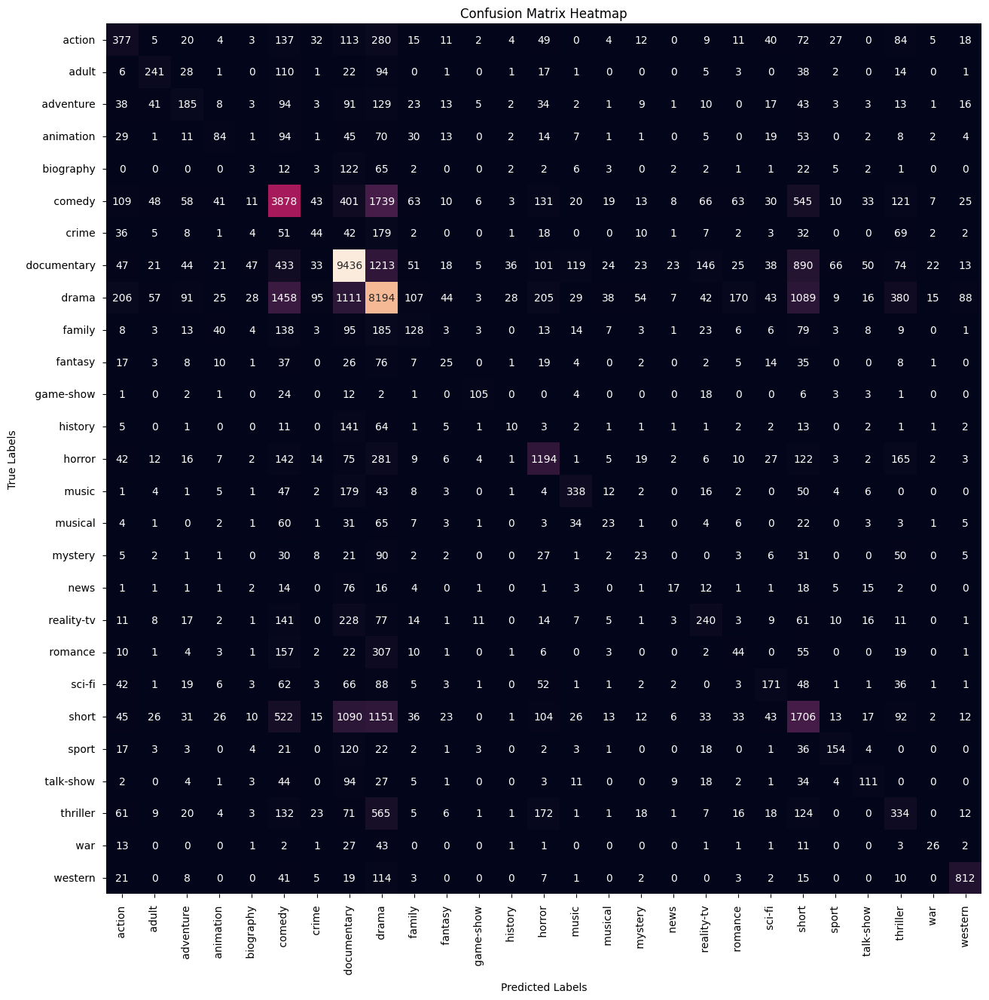

In [64]:
## Select SVC model

svm = LinearSVC()
svm.fit(x_train1 ,y_train)
print("Model Score on Training data",svm.score(x_train1 ,y_train))
print("Model Score on Training data",svm.score(x_test1 ,y_test))
y_pred = svm.predict(x_test1)
print(classification_report(y_pred ,y_test))
## As we can see from accuracy that the model the not performing well

cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(15, 15))  # Adjust the figure size as needed
sns.heatmap(cm, annot=True, fmt='d', cbar=False,
            xticklabels=class_names, yticklabels=class_names)  # Replace 'class_names' with your class labels
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap')
plt.show()

Random Forest - Train Score: 0.9995572527533344
Random Forest - Test Score: 0.4893832899809988
               precision    recall  f1-score   support

      action        0.01      0.67      0.02        18
       adult        0.07      0.75      0.13        57
   adventure        0.11      0.74      0.18       112
   animation        0.00      0.00      0.00         2
   biography        0.00      0.00      0.00         1
      comedy        0.26      0.57      0.36      3438
       crime        0.00      1.00      0.01         2
 documentary        0.89      0.55      0.68     20860
       drama        0.85      0.41      0.56     28167
      family        0.02      0.82      0.04        22
     fantasy        0.00      0.00      0.00         2
   game-show        0.40      0.89      0.56        83
     history        0.00      0.50      0.01         2
      horror        0.12      0.70      0.21       376
       music        0.12      0.83      0.20       102
     musical        0.01

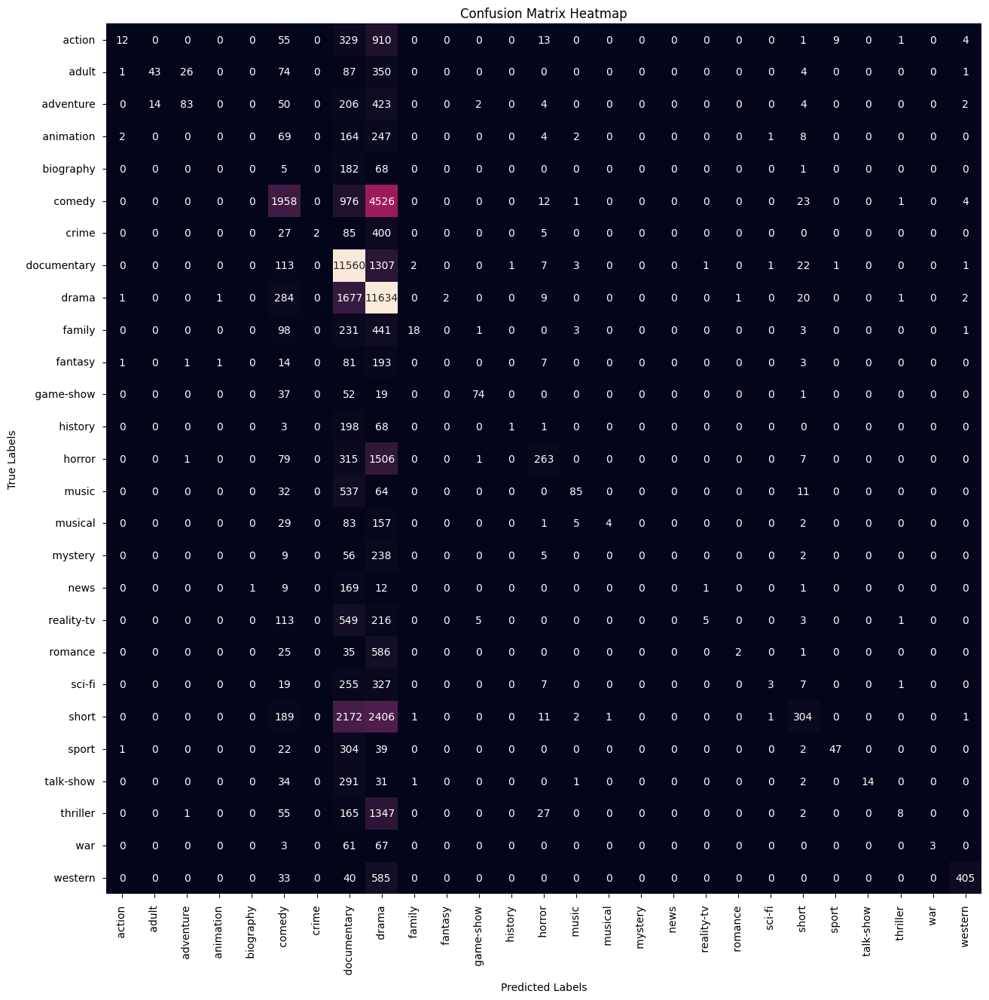

In [65]:
# Create a Random Forest model
random_forest = RandomForestClassifier()

# Fit the model with GridSearchCV
random_forest.fit(x_train1, y_train)
print("Random Forest - Train Score:",random_forest.score(x_train1, y_train))
print("Random Forest - Test Score:", random_forest.score(x_test1, y_test))

y_pred = random_forest.predict(x_test1)
print(classification_report(y_pred ,y_test))

cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(15, 15))  # Adjust the figure size as needed
sns.heatmap(cm, annot=True, fmt='d', cbar=False,
            xticklabels=class_names, yticklabels=class_names)  # Replace 'class_names' with your class labels
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap')
plt.show()

In [66]:
## Using TfidfVectorizer technique
vectorizer = TfidfVectorizer()
x_train2 = vectorize.fit_transform(x_train)
x_test2 =  vectorize.transform(x_test)

Model Score on Training data 0.6386813511170144
Model Score on Training data 0.5261313114542402
               precision    recall  f1-score   support

      action        0.03      0.66      0.06        62
       adult        0.03      0.76      0.05        21
   adventure        0.05      0.55      0.10        75
   animation        0.00      0.00      0.00         0
   biography        0.00      0.00      0.00         1
      comedy        0.44      0.54      0.49      6161
       crime        0.00      0.00      0.00         0
 documentary        0.90      0.57      0.70     20772
       drama        0.83      0.46      0.59     24557
      family        0.00      0.20      0.00        10
     fantasy        0.00      0.00      0.00        11
   game-show        0.17      1.00      0.30        32
     history        0.00      0.00      0.00         0
      horror        0.28      0.76      0.41       796
       music        0.04      0.88      0.08        34
     musical        0.0

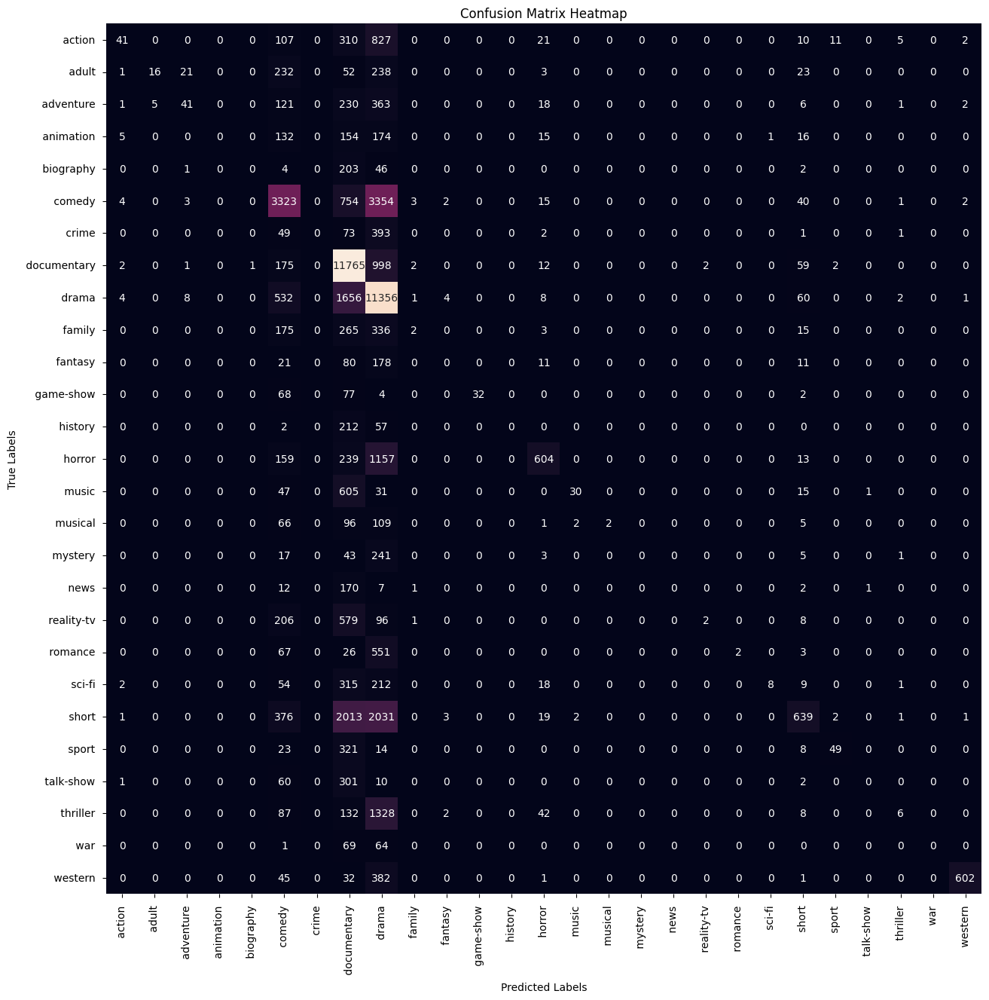

In [67]:
mnb = MultinomialNB()
mnb.fit(x_train2 ,y_train)
print("Model Score on Training data",mnb.score(x_train2 ,y_train))
print("Model Score on Training data",mnb.score(x_test2 ,y_test))
y_pred = mnb.predict(x_test2)
print(classification_report(y_pred ,y_test))


cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(15, 15))  # Adjust the figure size as needed
sns.heatmap(cm, annot=True, fmt='d', cbar=False,
            xticklabels=class_names, yticklabels=class_names)  # Replace 'class_names' with your class labels
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap')
plt.show()

Model Score on Training data 0.9966609478480639
Model Score on Training data 0.5695389894294095
               precision    recall  f1-score   support

      action        0.30      0.40      0.35      1017
       adult        0.41      0.62      0.49       387
   adventure        0.26      0.44      0.32       460
   animation        0.17      0.40      0.24       209
   biography        0.00      0.03      0.01        33
      comedy        0.58      0.53      0.56      8248
       crime        0.09      0.22      0.13       221
 documentary        0.79      0.70      0.74     14578
       drama        0.69      0.57      0.62     16579
      family        0.17      0.33      0.22       402
     fantasy        0.08      0.21      0.11       112
   game-show        0.61      0.83      0.70       134
     history        0.03      0.19      0.06        47
      horror        0.58      0.62      0.60      2024
       music        0.50      0.61      0.55       600
     musical        0.0

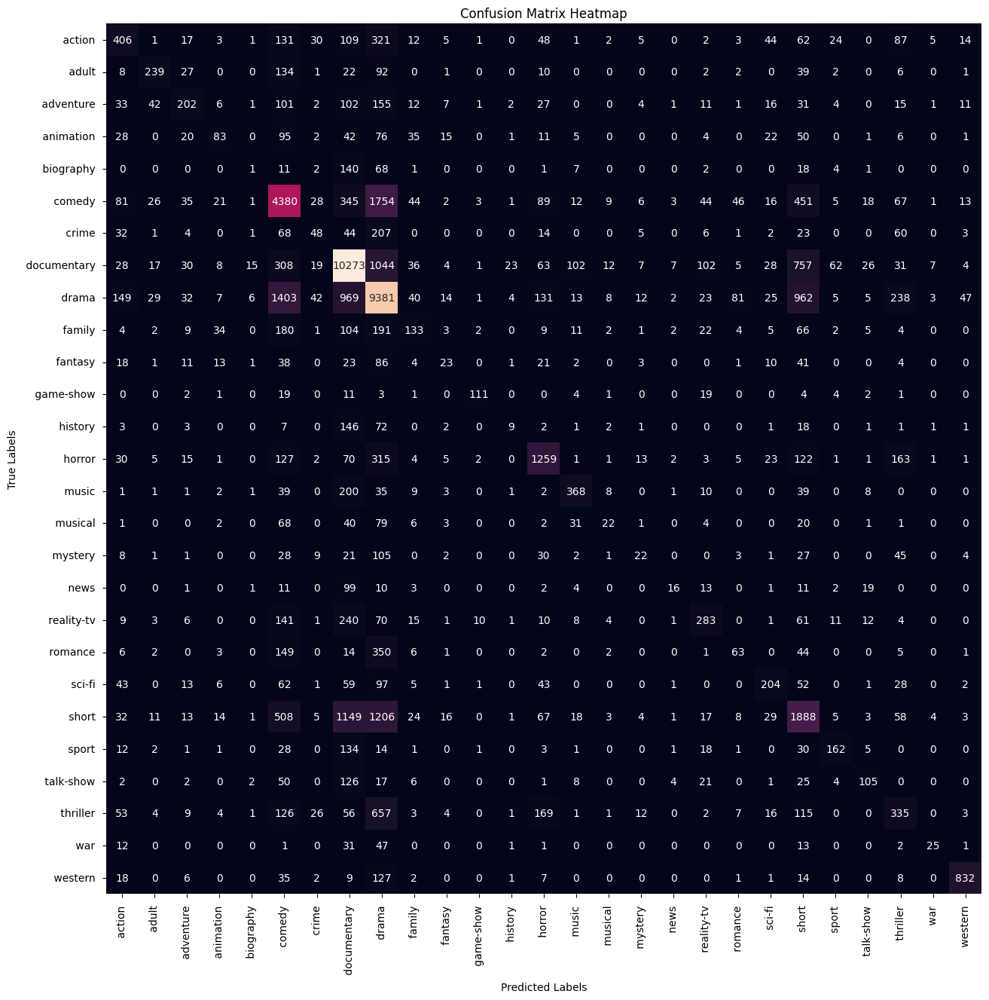

In [68]:
## select Logistic regression for this
model = LogisticRegression()
model.fit(x_train2 ,y_train)
print("Model Score on Training data",model.score(x_train2 ,y_train))
print("Model Score on Training data",model.score(x_test2 ,y_test))
y_pred = model.predict(x_test2)
print(classification_report(y_pred ,y_test))

cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(15, 15))  # Adjust the figure size as needed
sns.heatmap(cm, annot=True, fmt='d', cbar=False,
            xticklabels=class_names, yticklabels=class_names)  # Replace 'class_names' with your class labels
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap')
plt.show()

Model Score on Training data 0.99953880495139
Model Score on Training data 0.514915047872046
               precision    recall  f1-score   support

      action        0.28      0.33      0.30      1154
       adult        0.41      0.49      0.45       493
   adventure        0.23      0.31      0.27       594
   animation        0.17      0.29      0.21       294
   biography        0.01      0.02      0.02       136
      comedy        0.52      0.49      0.50      7890
       crime        0.08      0.13      0.10       332
 documentary        0.72      0.68      0.70     13782
       drama        0.60      0.54      0.57     15185
      family        0.16      0.24      0.19       538
     fantasy        0.08      0.13      0.10       193
   game-show        0.57      0.69      0.63       152
     history        0.04      0.10      0.05        96
      horror        0.55      0.54      0.55      2195
       music        0.46      0.53      0.50       635
     musical        0.08  

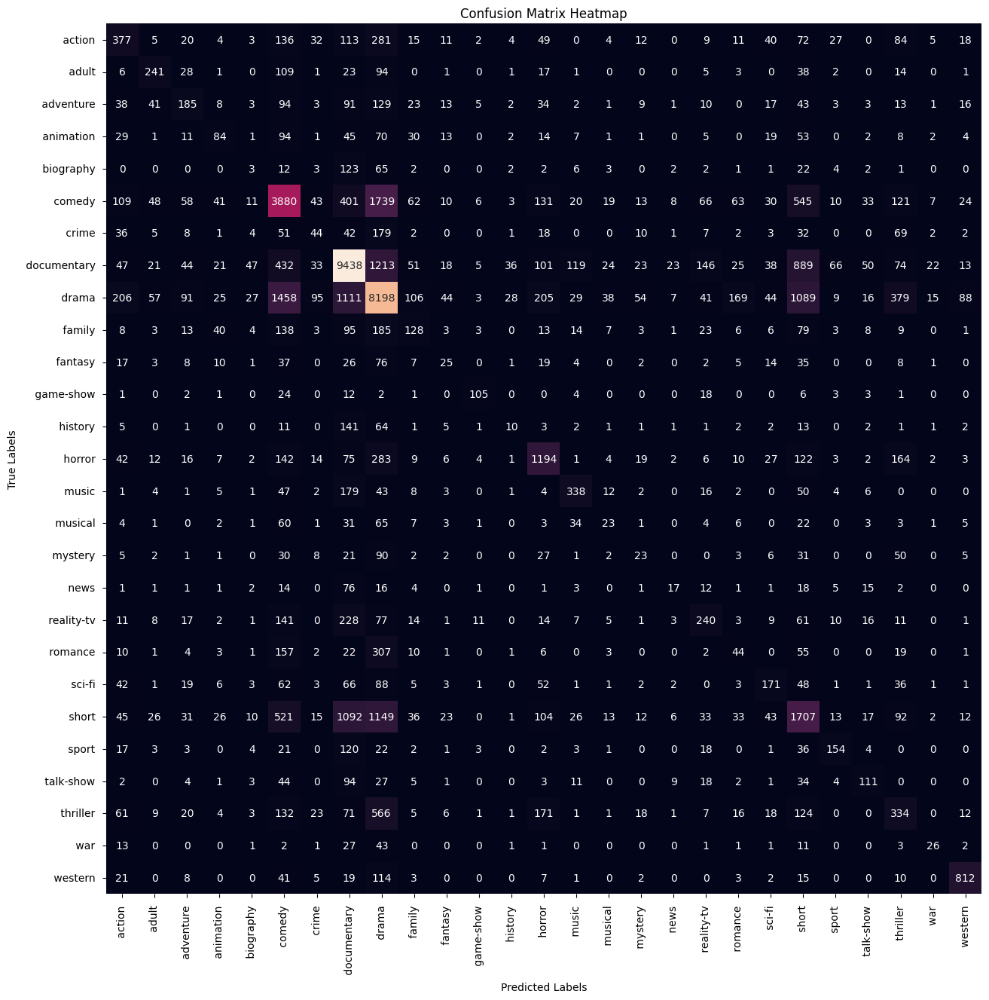

In [69]:
## Select SVC model

svm = LinearSVC()
svm.fit(x_train2 ,y_train)
print("Model Score on Training data",svm.score(x_train2 ,y_train))
print("Model Score on Training data",svm.score(x_test2 ,y_test))
y_pred = svm.predict(x_test2)
print(classification_report(y_pred ,y_test))

## As we can see from accuracy that the model the not performing well
cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(15, 15))  # Adjust the figure size as needed
sns.heatmap(cm, annot=True, fmt='d', cbar=False,
            xticklabels=class_names, yticklabels=class_names)  # Replace 'class_names' with your class labels
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap')
plt.show()

Random Forest - Train Score: 0.9995572527533344
Random Forest - Test Score: 0.48868227350711163
               precision    recall  f1-score   support

      action        0.01      0.78      0.01         9
       adult        0.07      0.75      0.12        52
   adventure        0.10      0.75      0.17       104
   animation        0.00      0.00      0.00         2
   biography        0.00      0.00      0.00         1
      comedy        0.25      0.56      0.35      3417
       crime        0.00      1.00      0.00         1
 documentary        0.89      0.55      0.68     21116
       drama        0.85      0.41      0.56     27959
      family        0.02      0.81      0.04        21
     fantasy        0.00      0.00      0.00         2
   game-show        0.45      0.84      0.59        99
     history        0.00      0.50      0.01         2
      horror        0.12      0.72      0.21       374
       music        0.12      0.88      0.21        98
     musical        0.0

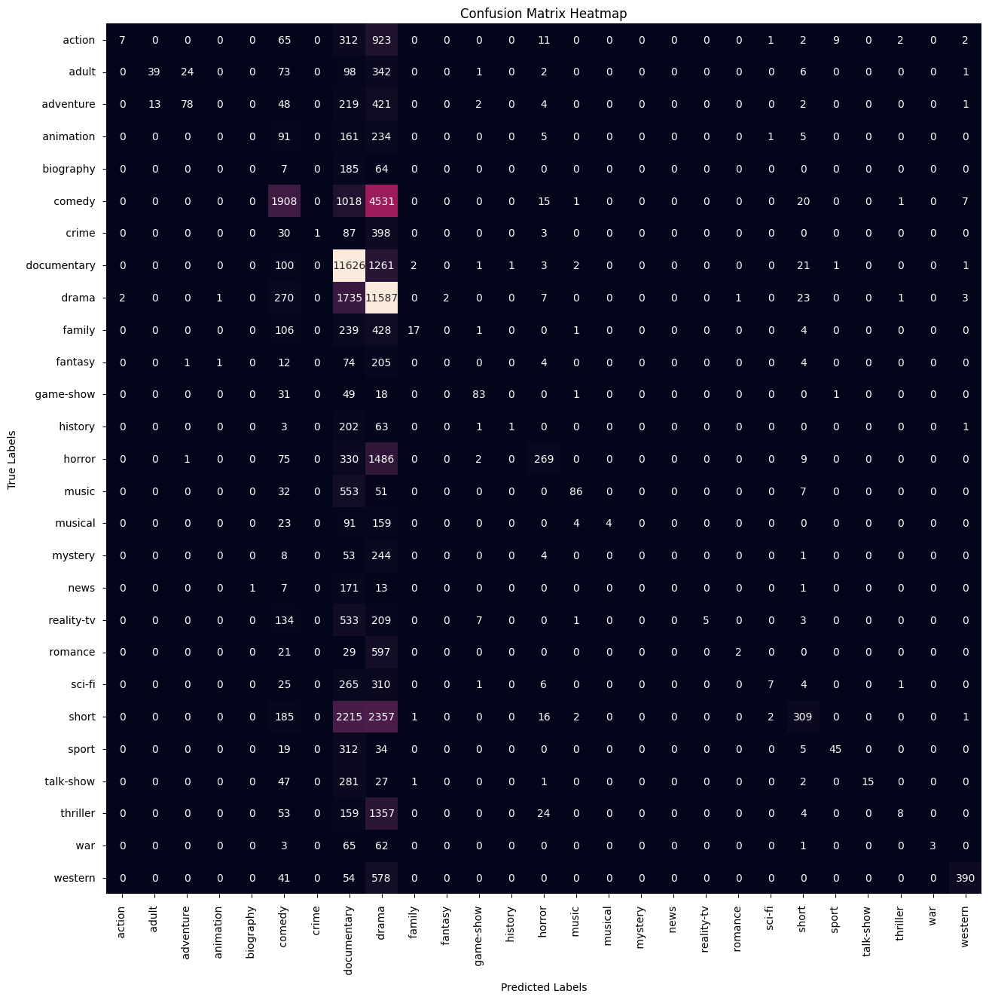

In [70]:
# Create a Random Forest model
random_forest = RandomForestClassifier()

# Fit the model with GridSearchCV
random_forest.fit(x_train2, y_train)

print("Random Forest - Train Score:",random_forest.score(x_train2, y_train))
print("Random Forest - Test Score:", random_forest.score(x_test2, y_test))

y_pred = random_forest.predict(x_test2)
print(classification_report(y_pred ,y_test))

cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(15, 15))  # Adjust the figure size as needed
sns.heatmap(cm, annot=True, fmt='d', cbar=False,
            xticklabels=class_names, yticklabels=class_names)  # Replace 'class_names' with your class labels
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix Heatmap')
plt.show()

In [71]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC

In [72]:
# Create Naive Bayes model
naive_bayes = MultinomialNB()
naive_bayes.fit(x_train2, y_train)

MultinomialNB()

In [73]:
# Evaluate Naive Bayes model
print("Naive Bayes - Train Score:", naive_bayes.score(x_train2, y_train))
print("Naive Bayes - Test Score:", naive_bayes.score(x_test2, y_test))
y_pred_nb = naive_bayes.predict(x_test2)
print("Naive Bayes Classification Report:")
print(classification_report(y_pred_nb, y_test))

Naive Bayes - Train Score: 0.6386813511170144
Naive Bayes - Test Score: 0.5261313114542402
Naive Bayes Classification Report:
               precision    recall  f1-score   support

      action        0.03      0.66      0.06        62
       adult        0.03      0.76      0.05        21
   adventure        0.05      0.55      0.10        75
   animation        0.00      0.00      0.00         0
   biography        0.00      0.00      0.00         1
      comedy        0.44      0.54      0.49      6161
       crime        0.00      0.00      0.00         0
 documentary        0.90      0.57      0.70     20772
       drama        0.83      0.46      0.59     24557
      family        0.00      0.20      0.00        10
     fantasy        0.00      0.00      0.00        11
   game-show        0.17      1.00      0.30        32
     history        0.00      0.00      0.00         0
      horror        0.28      0.76      0.41       796
       music        0.04      0.88      0.08    

In [74]:
# Create Logistic Regression model
logistic_regression = LogisticRegression()
logistic_regression.fit(x_train2, y_train)

LogisticRegression()

In [75]:
# Evaluate Logistic Regression model
print("\nLogistic Regression - Train Score:", logistic_regression.score(x_train2, y_train))
print("Logistic Regression - Test Score:", logistic_regression.score(x_test2, y_test))
y_pred_lr = logistic_regression.predict(x_test2)
print("Logistic Regression Classification Report:")
print(classification_report(y_pred_lr, y_test))


Logistic Regression - Train Score: 0.9966609478480639
Logistic Regression - Test Score: 0.5695389894294095
Logistic Regression Classification Report:
               precision    recall  f1-score   support

      action        0.30      0.40      0.35      1017
       adult        0.41      0.62      0.49       387
   adventure        0.26      0.44      0.32       460
   animation        0.17      0.40      0.24       209
   biography        0.00      0.03      0.01        33
      comedy        0.58      0.53      0.56      8248
       crime        0.09      0.22      0.13       221
 documentary        0.79      0.70      0.74     14578
       drama        0.69      0.57      0.62     16579
      family        0.17      0.33      0.22       402
     fantasy        0.08      0.21      0.11       112
   game-show        0.61      0.83      0.70       134
     history        0.03      0.19      0.06        47
      horror        0.58      0.62      0.60      2024
       music        0.5

In [ ]:
# Create Support Vector Machines (SVM) model
svm_classifier = SVC()
svm_classifier.fit(x_train2, y_train)

In [ ]:
# Evaluate SVM model
print("\nSupport Vector Machines (SVM) - Train Score:", svm_classifier.score(x_train2, y_train))
print("Support Vector Machines (SVM) - Test Score:", svm_classifier.score(x_test2, y_test))
y_pred_svm = svm_classifier.predict(x_test2)
print("SVM Classification Report:")
print(classification_report(y_pred_svm, y_test))